## Muat Data

### Subtask:
Muat dataset `311_latest_10k.csv` ke dalam DataFrame pandas.


In [122]:
import pandas as pd

url = "https://raw.githubusercontent.com/SitiFadhilahRahmi/Project-Big-Data-Kelompok7/refs/heads/main/311_latest_10k.csv"
df = pd.read_csv(url)


print("First 5 rows of the DataFrame:")
print(df.head())

print("\nDataFrame Information:")
df.info()

First 5 rows of the DataFrame:
   Unique Key         Created Date Closed Date Agency  \
0    45050101  2019-12-01 02:04:01         NaN    DOT   
1    45054936  2019-12-01 01:59:41         NaN   NYPD   
2    45049329  2019-12-01 01:59:08         NaN   NYPD   
3    45052046  2019-12-01 01:58:23         NaN   NYPD   
4    45054999  2019-12-01 01:58:07         NaN   NYPD   

                       Agency Name       Complaint Type  \
0     Department of Transportation     Street Condition   
1  New York City Police Department   Noise - Commercial   
2  New York City Police Department  Noise - Residential   
3  New York City Police Department  Noise - Residential   
4  New York City Police Department      Illegal Parking   

                     Descriptor               Location Type  Incident Zip  \
0                       Pothole                         NaN       10001.0   
1              Loud Music/Party         Club/Bar/Restaurant       11223.0   
2              Loud Music/Party  Residen

## Inspeksi Data Awal

### Subtask:
Lakukan inspeksi awal terhadap data untuk memahami struktur, tipe data, dan mengidentifikasi nilai yang hilang atau anomali.


In [123]:
print("\nUnique values per column:")
for column in df.columns:
    print(f"{column}: {df[column].nunique()} unique values")

print("\nMissing values per column:")
print(df.isnull().sum())

print("\nDescriptive statistics for numerical columns:")
print(df.describe())

print("\nDescriptive statistics for non-numerical columns:")
print(df.describe(include='object'))


Unique values per column:
Unique Key: 10000 unique values
Created Date: 9293 unique values
Closed Date: 4705 unique values
Agency: 14 unique values
Agency Name: 42 unique values
Complaint Type: 109 unique values
Descriptor: 376 unique values
Location Type: 52 unique values
Incident Zip: 189 unique values
Incident Address: 7047 unique values
Street Name: 2406 unique values
Cross Street 1: 2175 unique values
Cross Street 2: 2212 unique values
Intersection Street 1: 1816 unique values
Intersection Street 2: 1875 unique values
Address Type: 3 unique values
City: 85 unique values
Landmark: 1778 unique values
Facility Type: 1 unique values
Status: 5 unique values
Due Date: 0 unique values
Resolution Description: 98 unique values
Resolution Action Updated Date: 4530 unique values
Community Board: 70 unique values
BBL: 6334 unique values
Borough: 6 unique values
X Coordinate (State Plane): 6799 unique values
Y Coordinate (State Plane): 6947 unique values
Open Data Channel Type: 4 unique value

## Menangani Nilai yang Hilang

### Subtask:
Identifikasi dan tangani nilai yang hilang dalam dataset. Ini mungkin melibatkan penghapusan kolom atau imputasi berdasarkan karakteristik data.


In [124]:
missing_percentage = df.isnull().sum() / len(df) * 100
columns_to_drop = missing_percentage[missing_percentage > 90].index.tolist()

print("Columns to be dropped (more than 90% missing values):")
for col in columns_to_drop:
    print(f"- {col}: {missing_percentage[col]:.2f}%")

df.drop(columns=columns_to_drop, inplace=True)

print(f"\nDataFrame shape after dropping columns: {df.shape}")

Columns to be dropped (more than 90% missing values):
- Facility Type: 98.52%
- Due Date: 100.00%
- Vehicle Type: 99.96%
- Taxi Company Borough: 99.90%
- Taxi Pick Up Location: 98.41%
- Bridge Highway Name: 99.99%
- Bridge Highway Direction: 99.95%
- Road Ramp: 99.96%
- Bridge Highway Segment: 99.96%

DataFrame shape after dropping columns: (10000, 37)


In [125]:
df['Created Date'] = pd.to_datetime(df['Created Date'])
df['Closed Date'] = pd.to_datetime(df['Closed Date'])

print("Data types after converting 'Created Date' and 'Closed Date':")
print(df[['Created Date', 'Closed Date']].dtypes)

Data types after converting 'Created Date' and 'Closed Date':
Created Date    datetime64[ns]
Closed Date     datetime64[ns]
dtype: object


In [126]:
categorical_cols_to_fill = [
    'Descriptor', 'Location Type', 'Incident Address', 'Street Name',
    'Cross Street 1', 'Cross Street 2', 'Intersection Street 1',
    'Intersection Street 2', 'Address Type', 'City', 'Landmark',
    'Resolution Description', 'Park Facility Name'
]

for col in categorical_cols_to_fill:
    if col in df.columns:
        df[col] = df[col].fillna('Unknown')

print("Missing values in categorical columns after filling with 'Unknown':")
print(df[categorical_cols_to_fill].isnull().sum())

Missing values in categorical columns after filling with 'Unknown':
Descriptor                0
Location Type             0
Incident Address          0
Street Name               0
Cross Street 1            0
Cross Street 2            0
Intersection Street 1     0
Intersection Street 2     0
Address Type              0
City                      0
Landmark                  0
Resolution Description    0
Park Facility Name        0
dtype: int64


In [127]:
location_cols = ['Incident Zip', 'Latitude', 'Longitude']

# Hapus baris hanya jika kolom lokasi penting ini kosong
print(f"Baris sebelum drop lokasi kosong: {len(df)}")
df = df.dropna(subset=[col for col in location_cols if col in df.columns])
print(f"Baris setelah drop lokasi kosong: {len(df)}")

#Kolom ID Wilayah & Koordinat Sekunder
other_numerical_cols = [
    'BBL', 'X Coordinate (State Plane)', 'Y Coordinate (State Plane)',
    'Zip Codes', 'Community Districts', 'Borough Boundaries',
    'City Council Districts', 'Police Precincts'
]

for col in other_numerical_cols:
    if col in df.columns:
        df[col] = df[col].fillna(0)

print("\nSisa missing values di kolom numerik (seharusnya 0):")
all_num_cols = [c for c in location_cols + other_numerical_cols if c in df.columns]
print(df[all_num_cols].isnull().sum())

Baris sebelum drop lokasi kosong: 10000
Baris setelah drop lokasi kosong: 9830

Sisa missing values di kolom numerik (seharusnya 0):
Incident Zip                  0
Latitude                      0
Longitude                     0
BBL                           0
X Coordinate (State Plane)    0
Y Coordinate (State Plane)    0
Zip Codes                     0
Community Districts           0
Borough Boundaries            0
City Council Districts        0
Police Precincts              0
dtype: int64


In [128]:
print("\nTotal missing values after handling:")
print(df.isnull().sum())


Total missing values after handling:
Unique Key                           0
Created Date                         0
Closed Date                       4720
Agency                               0
Agency Name                          0
Complaint Type                       0
Descriptor                           0
Location Type                        0
Incident Zip                         0
Incident Address                     0
Street Name                          0
Cross Street 1                       0
Cross Street 2                       0
Intersection Street 1                0
Intersection Street 2                0
Address Type                         0
City                                 0
Landmark                             0
Status                               0
Resolution Description               0
Resolution Action Updated Date    2287
Community Board                      0
BBL                                  0
Borough                              0
X Coordinate (State Plane)

## Pembersihan dan Transformasi Data

### Subtask:
Lakukan pembersihan data, seperti mengonversi tipe data yang sesuai, menangani duplikat, dan potensi transformasi fitur dasar jika diperlukan.


In [129]:
df['Resolution Action Updated Date'] = pd.to_datetime(df['Resolution Action Updated Date'])

print("Data type after converting 'Resolution Action Updated Date':")
print(df['Resolution Action Updated Date'].dtype)

Data type after converting 'Resolution Action Updated Date':
datetime64[ns]


In [130]:
df['Location'] = df['Location'].fillna('Unknown')

print("Missing values in 'Location' column after filling:")
print(df['Location'].isnull().sum())

Missing values in 'Location' column after filling:
0


In [131]:
print(f"DataFrame shape before dropping duplicates: {df.shape}")
df.drop_duplicates(inplace=True)
print(f"DataFrame shape after dropping duplicates: {df.shape}")

DataFrame shape before dropping duplicates: (9830, 37)
DataFrame shape after dropping duplicates: (9830, 37)


In [132]:
df['Complaint Duration'] = df['Closed Date'] - df['Created Date']

print("First 5 rows of 'Complaint Duration' column:")
print(df['Complaint Duration'].head())
print(f"Data type of 'Complaint Duration': {df['Complaint Duration'].dtype}")

First 5 rows of 'Complaint Duration' column:
0   NaT
1   NaT
2   NaT
3   NaT
4   NaT
Name: Complaint Duration, dtype: timedelta64[ns]
Data type of 'Complaint Duration': timedelta64[ns]


In [133]:
df['Created Hour'] = df['Created Date'].dt.hour

print("First 5 rows of 'Created Hour' column:")
print(df['Created Hour'].head())
print(f"Data type of 'Created Hour': {df['Created Hour'].dtype}")

First 5 rows of 'Created Hour' column:
0    2
1    1
2    1
3    1
4    1
Name: Created Hour, dtype: int32
Data type of 'Created Hour': int32


## Simpan Data yang Telah Diproses

### Subtask:
Simpan DataFrame yang telah dibersihkan dan ditransformasi ke file CSV baru bernama `311_prepocessed.csv`.


In [134]:
df.to_csv('311_prepocessed.csv', index=False)
print("DataFrame 'df' successfully saved to '311_prepocessed.csv'.")

DataFrame 'df' successfully saved to '311_prepocessed.csv'.


In [135]:
df_processed = pd.read_csv('311_prepocessed.csv')

print("First 5 rows of the processed DataFrame:")
print(df_processed.head())

print("\nInformation of the processed DataFrame:")
df_processed.info()

First 5 rows of the processed DataFrame:
   Unique Key         Created Date Closed Date Agency  \
0    45050101  2019-12-01 02:04:01         NaN    DOT   
1    45054936  2019-12-01 01:59:41         NaN   NYPD   
2    45049329  2019-12-01 01:59:08         NaN   NYPD   
3    45052046  2019-12-01 01:58:23         NaN   NYPD   
4    45054999  2019-12-01 01:58:07         NaN   NYPD   

                       Agency Name       Complaint Type  \
0     Department of Transportation     Street Condition   
1  New York City Police Department   Noise - Commercial   
2  New York City Police Department  Noise - Residential   
3  New York City Police Department  Noise - Residential   
4  New York City Police Department      Illegal Parking   

                     Descriptor               Location Type  Incident Zip  \
0                       Pothole                     Unknown       10001.0   
1              Loud Music/Party         Club/Bar/Restaurant       11223.0   
2              Loud Music/Part

In [136]:
import pandas as pd
import numpy as np

# 1. MUAT ULANG DATAFRAME dan KONVERSI TIPE DATA
try:
    df = pd.read_csv('311_prepocessed.csv')

    # Konversi kolom tanggal kembali ke tipe datetime
    df['Created Date'] = pd.to_datetime(df['Created Date'])
    df['Closed Date'] = pd.to_datetime(df['Closed Date'])
    df['Resolution Action Updated Date'] = pd.to_datetime(df['Resolution Action Updated Date'])

    # Konversi kolom 'Complaint Duration' kembali ke timedelta
    df['Complaint Duration'] = pd.to_timedelta(df['Complaint Duration'])

    print("✅ DataFrame 'df' berhasil dimuat ulang dan tipe data dikonversi.")

except FileNotFoundError:
    print("Error: File '311_prepocessed.csv' tidak ditemukan. Mohon pastikan langkah penyimpanan data sudah berhasil dijalankan.")
    raise

# 2. EKSTRAKSI FITUR TEMPORAL
print("\n--- 1. Ekstraksi Fitur Temporal ---")
df['Created Day of Week'] = df['Created Date'].dt.dayofweek
df['Created Month'] = df['Created Date'].dt.month

# Hitung Durasi Keluhan dalam Jam (dari timedelta)
df['Complaint Duration Hours'] = df['Complaint Duration'].dt.total_seconds() / 3600

print("First 5 rows of new temporal features:")
print(df[['Created Day of Week', 'Created Month', 'Complaint Duration Hours']].head())

# 3. EKSTRAKSI FITUR LOKASI (NORMALISASI BOROUGH)
print("\n--- 2. Normalisasi Fitur Lokasi ---")
# Normalisasi 'Borough' dan 'Park Borough' ke huruf kapital dan hapus spasi
df['Borough'] = df['Borough'].str.upper().str.strip()
df['Park Borough'] = df['Park Borough'].str.upper().str.strip()

print(f"Borough unik setelah normalisasi: {df['Borough'].unique()}")

# 4. EKSTRAKSI FITUR TEKS SEDERHANA
print("\n--- 3. Ekstraksi Fitur Teks Sederhana ---")
# Hitung panjang (jumlah karakter) dari 'Resolution Description'
temp_desc = df['Resolution Description'].replace('Unknown', None)
df['Resolution Description Length'] = temp_desc.str.len().fillna(0).astype(int)

# Hitung panjang (jumlah karakter) dari 'Complaint Type'
df['Complaint Type Length'] = df['Complaint Type'].str.len().fillna(0).astype(int)

print("First 5 rows of new text features:")
print(df[['Resolution Description Length', 'Complaint Type Length']].head())


# 5. SIMPAN DATA AKHIR
final_filename = '311_prepocessed_and_featured.csv'
df.to_csv(final_filename, index=False)
print(f"\n✅ DataFrame akhir berhasil disimpan ke '{final_filename}'.")

print("\nFinal DataFrame Information:")
df.info()

✅ DataFrame 'df' berhasil dimuat ulang dan tipe data dikonversi.

--- 1. Ekstraksi Fitur Temporal ---
First 5 rows of new temporal features:
   Created Day of Week  Created Month  Complaint Duration Hours
0                    6             12                       NaN
1                    6             12                       NaN
2                    6             12                       NaN
3                    6             12                       NaN
4                    6             12                       NaN

--- 2. Normalisasi Fitur Lokasi ---
Borough unik setelah normalisasi: ['MANHATTAN' 'BROOKLYN' 'QUEENS' 'BRONX' 'STATEN ISLAND']

--- 3. Ekstraksi Fitur Teks Sederhana ---
First 5 rows of new text features:
   Resolution Description Length  Complaint Type Length
0                            104                     16
1                              0                     18
2                              0                     19
3                              0            

Ekstraksi Fitur Temporal

In [137]:
df = df_processed

df['Created Date'] = pd.to_datetime(df['Created Date'])
df['Closed Date'] = pd.to_datetime(df['Closed Date'])

df['Complaint Duration'] = pd.to_timedelta(df['Complaint Duration'])

df['Created Day of Week'] = df['Created Date'].dt.dayofweek

df['Created Month'] = df['Created Date'].dt.month

df['Complaint Duration Hours'] = df['Complaint Duration'].dt.total_seconds() / 3600

print("First 5 rows of new temporal features:")
print(df[['Created Day of Week', 'Created Month', 'Complaint Duration Hours']].head())

First 5 rows of new temporal features:
   Created Day of Week  Created Month  Complaint Duration Hours
0                    6             12                       NaN
1                    6             12                       NaN
2                    6             12                       NaN
3                    6             12                       NaN
4                    6             12                       NaN


Ekstraksi Fitur Lokasi

In [138]:
print("Unique values in 'Borough':")
print(df['Borough'].unique())

print("\nUnique values in 'Park Borough':")
print(df['Park Borough'].unique())

# Normalisasi 'Borough'
df['Borough'] = df['Borough'].str.upper().str.strip()
df['Park Borough'] = df['Park Borough'].str.upper().str.strip()

print("\nUnique values in 'Borough' after normalization:")
print(df['Borough'].unique())

Unique values in 'Borough':
['MANHATTAN' 'BROOKLYN' 'QUEENS' 'BRONX' 'STATEN ISLAND']

Unique values in 'Park Borough':
['MANHATTAN' 'BROOKLYN' 'QUEENS' 'BRONX' 'STATEN ISLAND']

Unique values in 'Borough' after normalization:
['MANHATTAN' 'BROOKLYN' 'QUEENS' 'BRONX' 'STATEN ISLAND']


Ekstraksi Fitur Teks Sederhana

In [139]:
# Hitung panjang (jumlah karakter) dari 'Resolution Description'
temp_desc = df['Resolution Description'].replace('Unknown', None)
df['Resolution Description Length'] = temp_desc.str.len().fillna(0).astype(int)

# Hitung panjang (jumlah karakter) dari 'Complaint Type'
df['Complaint Type Length'] = df['Complaint Type'].str.len()

print("First 5 rows of new text features:")
print(df[['Resolution Description Length', 'Complaint Type Length']].head())

First 5 rows of new text features:
   Resolution Description Length  Complaint Type Length
0                            104                     16
1                              0                     18
2                              0                     19
3                              0                     19
4                              0                     15


Ringkasan & Penyimpanan

In [140]:
df.to_csv('311_prepocessed_and_featured.csv', index=False)
print("DataFrame 'df' successfully saved to '311_prepocessed_and_featured.csv'.")

print("\nFinal DataFrame Information:")
print(df.info())

DataFrame 'df' successfully saved to '311_prepocessed_and_featured.csv'.

Final DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9830 entries, 0 to 9829
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype          
---  ------                          --------------  -----          
 0   Unique Key                      9830 non-null   int64          
 1   Created Date                    9830 non-null   datetime64[ns] 
 2   Closed Date                     5110 non-null   datetime64[ns] 
 3   Agency                          9830 non-null   object         
 4   Agency Name                     9830 non-null   object         
 5   Complaint Type                  9830 non-null   object         
 6   Descriptor                      9830 non-null   object         
 7   Location Type                   9830 non-null   object         
 8   Incident Zip                    9830 non-null   float64        
 9   Incident Address          

Preprocessing Summary
1. Pemuatan Data:
- Dataset '311_latest_10k.csv' berhasil dimuat dengan benar setelah penyesuaian pemisah (semicolon) dan mengabaikan baris yang error.

2. Penanganan Nilai Hilang:
- Sembilan kolom dengan lebih dari 90% nilai hilang (misalnya 'Facility Type', 'Due Date') telah dihapus.
- Nilai hilang di kolom kategorikal utama (misalnya 'Descriptor', 'Location Type', 'City') diisi dengan 'Unknown'.
- Baris dengan nilai hilang di kolom lokasi krusial ('Incident Zip', 'Latitude', 'Longitude') dihapus.
- Nilai hilang di kolom numerik lainnya (misalnya 'BBL', 'Zip Codes') diisi dengan 0.

3. Konversi Tipe Data:
Kolom tanggal ('Created Date', 'Closed Date', 'Resolution Action Updated Date') dikonversi ke format datetime.

4. Transformasi Fitur:
- Dibuat dua kolom baru: 'Complaint Duration' (durasi keluhan) dan 'Created Hour' (jam pembuatan keluhan).

5. Duplikasi: Tidak ada duplikasi baris yang ditemukan dalam dataset.

 6. Hasil Akhir:
- Data yang telah bersih dan ditransformasi ini (dengan 39 kolom dan 9830 baris) berhasil disimpan ke file '311_prepocessed.csv'.
- Data siap untuk analisis lebih lanjut.

## Identifikasi Kolom Numerik

### Subtask:
Identifikasi kolom numerik yang akan distandarisasi.


**Reasoning**:
To identify numerical columns for standardization, I will create a Python list containing the specified column names.



In [141]:
numerical_cols_to_standardize = [
    'Incident Zip',
    'BBL',
    'X Coordinate (State Plane)',
    'Y Coordinate (State Plane)',
    'Latitude',
    'Longitude',
    'Zip Codes',
    'Community Districts',
    'Borough Boundaries',
    'City Council Districts',
    'Police Precincts',
    'Created Hour',
    'Created Day of Week',
    'Created Month',
    'Complaint Duration Hours',
    'Resolution Description Length',
    'Complaint Type Length'
]

print("Kolom numerik yang akan distandarisasi:")
for col in numerical_cols_to_standardize:
    print(f"- {col}")

Kolom numerik yang akan distandarisasi:
- Incident Zip
- BBL
- X Coordinate (State Plane)
- Y Coordinate (State Plane)
- Latitude
- Longitude
- Zip Codes
- Community Districts
- Borough Boundaries
- City Council Districts
- Police Precincts
- Created Hour
- Created Day of Week
- Created Month
- Complaint Duration Hours
- Resolution Description Length
- Complaint Type Length


In [142]:
from sklearn.preprocessing import StandardScaler

# Handle NaN values in 'Complaint Duration Hours' with the median
median_complaint_duration_hours = df['Complaint Duration Hours'].median()
df['Complaint Duration Hours'].fillna(median_complaint_duration_hours, inplace=True)

print(f"Missing values in 'Complaint Duration Hours' after median imputation: {df['Complaint Duration Hours'].isnull().sum()}")

# Initialize StandardScaler
scaler = StandardScaler()

# Apply StandardScaler to the selected numerical columns
df[numerical_cols_to_standardize] = scaler.fit_transform(df[numerical_cols_to_standardize])

print("\nFirst 5 rows of standardized numerical columns:")
print(df[numerical_cols_to_standardize].head())

print("\nDescriptive statistics of standardized numerical columns:")
print(df[numerical_cols_to_standardize].describe())

Missing values in 'Complaint Duration Hours' after median imputation: 0

First 5 rows of standardized numerical columns:
   Incident Zip       BBL  X Coordinate (State Plane)  \
0     -1.476624 -1.876624                   -0.930480   
1      0.784191  0.448021                   -0.796039   
2      0.754589  0.427092                    0.465936   
3      1.033953  1.191844                    1.489066   
4      1.159760  1.211418                    2.518909   

   Y Coordinate (State Plane)  Latitude  Longitude  Zip Codes  \
0                    0.053293  0.053894  -0.931431  -1.013397   
1                   -1.637512 -1.636896  -0.797570  -1.013397   
2                   -0.910082 -0.910120   0.463915  -1.013397   
3                    0.217474  0.216243   1.490271  -1.013397   
4                   -0.126380 -0.129353   2.519363  -1.013397   

   Community Districts  Borough Boundaries  City Council Districts  \
0            -0.841228           -0.952071               -0.868272   
1    

/tmp/ipython-input-3408738702.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Complaint Duration Hours'].fillna(median_complaint_duration_hours, inplace=True)


#**MODELING**

# **HDBSCAN**

In [143]:
!pip install hdbscan
import pandas as pd

df = pd.read_csv("311_prepocessed_and_featured.csv")

In [144]:
coords = df[['Latitude', 'Longitude']].to_numpy()
coords[:5]


array([[ 40.74566848, -73.98771883],
       [ 40.59647471, -73.97772148],
       [ 40.66060478, -73.88350827],
       [ 40.759994  , -73.80685561],
       [ 40.7294989 , -73.72999848]])

In [145]:
import hdbscan

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=70,
    min_samples=10,
    metric='euclidean',
    cluster_selection_method='eom'
)

df['cluster'] = clusterer.fit_predict(coords)

df['cluster'].value_counts()

df.to_csv("df_with_clusters.csv", index=False)

print("DataFrame dengan hasil klastering berhasil disimpan ke 'df_with_clusters.csv'")


DataFrame dengan hasil klastering berhasil disimpan ke 'df_with_clusters.csv'


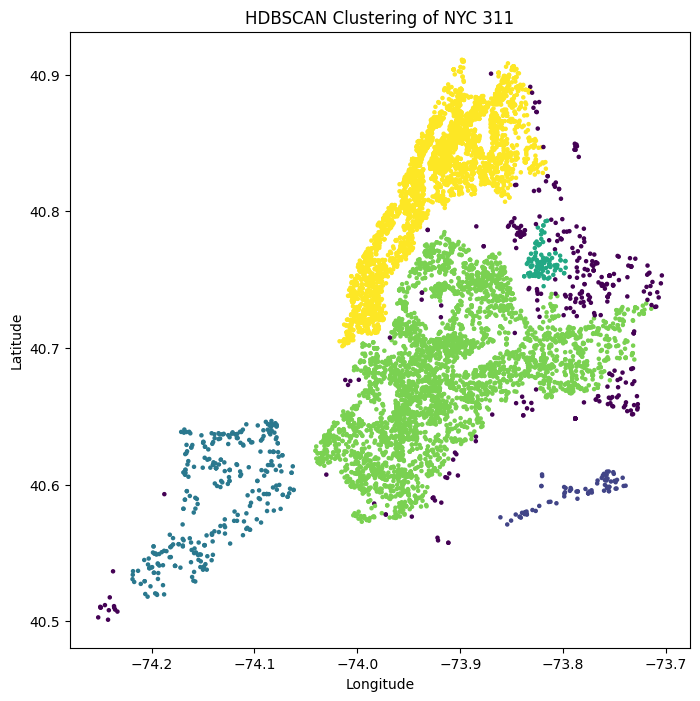

In [146]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.scatter(df['Longitude'], df['Latitude'], c=df['cluster'], s=5)
plt.title("HDBSCAN Clustering of NYC 311")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [147]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np

# Ambil fitur numerik
coords = df[['Latitude', 'Longitude']].values
labels = df['cluster'].values

mask = labels != -1
coords_no_noise = coords[mask]
labels_no_noise = labels[mask]

sil_score = silhouette_score(coords_no_noise, labels_no_noise)

db_index = davies_bouldin_score(coords_no_noise, labels_no_noise)

ch_score = calinski_harabasz_score(coords_no_noise, labels_no_noise)

print("====== HDBSCAN Cluster Evaluation ======")
print(f"Silhouette Score        : {sil_score:.4f}")
print(f"Davies-Bouldin Index    : {db_index:.4f}")
print(f"Calinski-Harabasz Score : {ch_score:.4f}")


====== HDBSCAN Cluster Evaluation ======
Silhouette Score        : 0.2409
Davies-Bouldin Index    : 0.7456
Calinski-Harabasz Score : 3343.6057


In [148]:
top_types = (
    df.groupby('cluster')['Complaint Type']
      .value_counts()
      .groupby(level=0)
      .head(5)
)

print(top_types)


cluster  Complaint Type                   
-1       Illegal Parking                        47
         Noise - Residential                    32
         Blocked Driveway                       26
         Water System                           20
         Abandoned Vehicle                      18
 0       Illegal Parking                        15
         HEAT/HOT WATER                         13
         Noise - Residential                    11
         Blocked Driveway                        9
         Sewer                                   4
 1       Illegal Parking                        42
         Noise - Residential                    39
         Missed Collection (All Materials)      33
         Blocked Driveway                       20
         Abandoned Vehicle                      16
 2       Blocked Driveway                       29
         Noise - Residential                    21
         HEAT/HOT WATER                         14
         Abandoned Vehicle             

In [149]:
print(df['cluster'].value_counts())


cluster
 3    4667
 4    4318
-1     330
 1     313
 2     122
 0      80
Name: count, dtype: int64


In [150]:
centroids = df.groupby('cluster')[['Latitude', 'Longitude']].mean()
centroids


,Latitude,Longitude
cluster,,
-1,40.724033,-73.819156
0,40.594053,-73.788476
1,40.592295,-74.134832
2,40.763246,-73.820067
3,40.679805,-73.910613
4,40.821113,-73.923341


In [151]:
import folium
import numpy as np

m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()],
               zoom_start=11, tiles='cartodbpositron')

unique_clusters = df['cluster'].unique()
colors = {
    c: f"#{''.join(np.random.choice(list('0123456789ABCDEF'), 6))}"
    for c in unique_clusters
}

for _, row in df.iterrows():
    cluster_id = row['cluster']
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,                   # ← besarkan radius
        popup=folium.Popup(
            f"""
            <b>Cluster:</b> {cluster_id}<br>
            <b>Complaint Type:</b> {row['Complaint Type']}<br>
            <b>Borough:</b> {row['Borough']}
            """, max_width=300),
        color='black',              # outline hitam agar tegas
        weight=1,                   # ketebalan outline
        fill=True,
        fill_color=colors[row['cluster']],
        fill_opacity=0.8
    ).add_to(m)

m.save("map_big_marker.html")
m


cluster
-1     330
 0      80
 1     313
 2     122
 3    4667
 4    4318
Name: count, dtype: int64


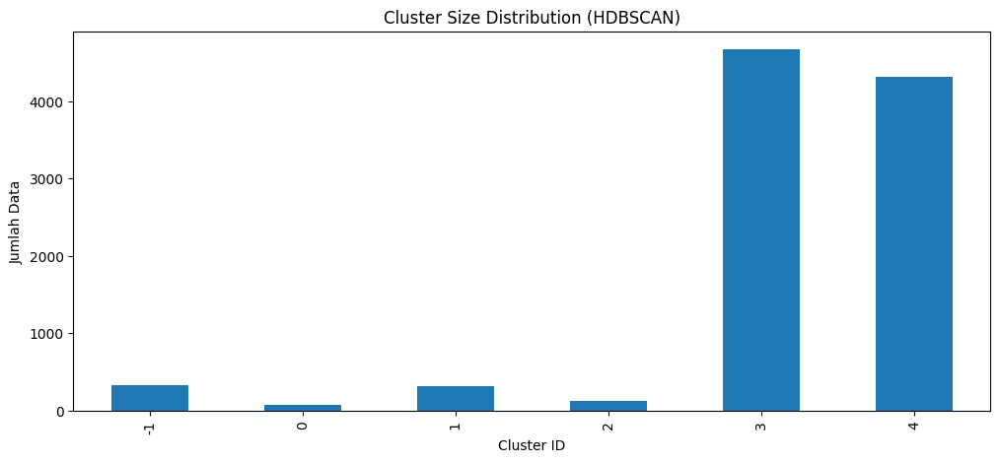

In [152]:
import pandas as pd
import matplotlib.pyplot as plt

# Distribusi cluster
cluster_counts = df['cluster'].value_counts().sort_index()
print(cluster_counts)

# Plot distribusi
plt.figure(figsize=(12,5))
cluster_counts.plot(kind='bar')
plt.title("Cluster Size Distribution (HDBSCAN)")
plt.xlabel("Cluster ID")
plt.ylabel("Jumlah Data")
plt.show()


In [153]:
for c in sorted(df['cluster'].unique()):
    top_borough = df[df['cluster'] == c]['Borough'].value_counts()
    print(f"\n=== Cluster {c} – Borough Distribution ===")
    print(top_borough)



=== Cluster -1 – Borough Distribution ===
Borough
QUEENS           257
BRONX             32
BROOKLYN          25
STATEN ISLAND     14
MANHATTAN          2
Name: count, dtype: int64

=== Cluster 0 – Borough Distribution ===
Borough
QUEENS    80
Name: count, dtype: int64

=== Cluster 1 – Borough Distribution ===
Borough
STATEN ISLAND    313
Name: count, dtype: int64

=== Cluster 2 – Borough Distribution ===
Borough
QUEENS    122
Name: count, dtype: int64

=== Cluster 3 – Borough Distribution ===
Borough
BROOKLYN    2770
QUEENS      1897
Name: count, dtype: int64

=== Cluster 4 – Borough Distribution ===
Borough
BRONX        2250
MANHATTAN    2068
Name: count, dtype: int64


In [154]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score

from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier

df = pd.read_csv("/content/df_with_clusters.csv")


In [155]:
df_ct = df.dropna(subset=["Descriptor", "Complaint Type"])

# Ambil top 20 jenis complaint
top_types = df_ct["Complaint Type"].value_counts().head(20).index
df_ct = df_ct[df_ct["Complaint Type"].isin(top_types)]

X = df_ct["Descriptor"]
y = df_ct["Complaint Type"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

complaint_clf = Pipeline([
    ("tfidf", TfidfVectorizer(stop_words="english", max_features=5000)),
    ("clf", LogisticRegression(max_iter=2000))
])

complaint_clf.fit(X_train, y_train)

print("\n=== Complaint Type Prediction Report ===")
print(classification_report(y_test, complaint_clf.predict(X_test)))


=== Complaint Type Prediction Report ===
                                   precision    recall  f1-score   support

                Abandoned Vehicle       1.00      1.00      1.00        34
                 Blocked Driveway       1.00      1.00      1.00       176
             Broken Parking Meter       0.95      1.00      0.98        20
    General Construction/Plumbing       1.00      0.88      0.93        24
                   HEAT/HOT WATER       1.00      1.00      1.00       442
                  Illegal Parking       0.99      0.99      0.99       178
Missed Collection (All Materials)       1.00      1.00      1.00        22
                            Noise       1.00      1.00      1.00        28
               Noise - Commercial       0.00      0.00      0.00        47
               Noise - Helicopter       0.83      1.00      0.91        15
              Noise - Residential       0.82      1.00      0.90       384
          Noise - Street/Sidewalk       0.00      0.00   

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [156]:
df_loc = df.dropna(subset=["Latitude", "Longitude", "Borough"])

# Encode borough
le = LabelEncoder()
df_loc["borough_encoded"] = le.fit_transform(df_loc["Borough"])

# KNN pakai Haversine (butuh radian)
coords = np.radians(df_loc[["Latitude", "Longitude"]])

borough_knn = KNeighborsClassifier(
    n_neighbors=5,
    metric="haversine"
)

borough_knn.fit(coords, df_loc["borough_encoded"])

KNeighborsClassifier(metric='haversine')

In [157]:
df_cluster = df.dropna(subset=["Latitude", "Longitude", "Borough", "cluster"])

Xc = df_cluster[["Latitude", "Longitude", "Borough"]]
yc = df_cluster["cluster"]

preprocess = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['Borough'])
    ],
    remainder='passthrough'
)

model_cluster = Pipeline([
    ("preprocess", preprocess),
    ("clf", RandomForestClassifier(n_estimators=300, random_state=42))
])

X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    Xc, yc, test_size=0.25, random_state=42, stratify=yc
)

model_cluster.fit(X_train_c, y_train_c)

print("\n===== Cluster Model Evaluation =====")
print(accuracy_score(y_test_c, model_cluster.predict(X_test_c)))
print(classification_report(y_test_c, model_cluster.predict(X_test_c)))


===== Cluster Model Evaluation =====
0.9951179820992677
              precision    recall  f1-score   support

          -1       0.95      0.90      0.93        83
           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        78
           2       0.94      1.00      0.97        30
           3       1.00      1.00      1.00      1167
           4       1.00      1.00      1.00      1080

    accuracy                           1.00      2458
   macro avg       0.98      0.98      0.98      2458
weighted avg       1.00      1.00      1.00      2458



In [158]:
def predict_complaint_and_cluster(text, lat, lon):

    # A. Prediksi complaint type
    predicted_type = complaint_clf.predict([text])[0]

    # B. Prediksi borough dari lat/lon (bukan dari complaint!)
    coords = np.radians([[lat, lon]])
    borough_encoded = borough_knn.predict(coords)[0]
    predicted_borough = le.inverse_transform([borough_encoded])[0]

    # C. Prediksi cluster
    df_input = pd.DataFrame([{
        "Latitude": lat,
        "Longitude": lon,
        "Borough": predicted_borough
    }])

    predicted_cluster = model_cluster.predict(df_input)[0]

    return {
        "predicted_complaint_type": predicted_type,
        "predicted_borough": predicted_borough,
        "predicted_cluster": int(predicted_cluster)
    }

In [159]:
result = predict_complaint_and_cluster(
    text="There is no heat in my apartment for 3 days",
    lat=40.8370,
    lon=-73.8654
)

print("\n=== FINAL RESULT ===")
print(result)


=== FINAL RESULT ===
{'predicted_complaint_type': 'HEAT/HOT WATER', 'predicted_borough': 'BRONX', 'predicted_cluster': 4}


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


In [160]:
import joblib

joblib.dump(complaint_clf, "complaint_model.pkl")
joblib.dump(borough_knn, "borough_knn.pkl")
joblib.dump(le, "borough_label_encoder.pkl")
joblib.dump(model_cluster, "cluster_model.pkl")

print("\n🎉 Semua model berhasil disimpan!")
print("📁 Saved files:")
print("- complaint_model.pkl")
print("- borough_knn.pkl")
print("- borough_label_encoder.pkl")
print("- cluster_model.pkl")


🎉 Semua model berhasil disimpan!
📁 Saved files:
- complaint_model.pkl
- borough_knn.pkl
- borough_label_encoder.pkl
- cluster_model.pkl


In [161]:
from google.colab import files
files.download('/content/complaint_model.pkl')
files.download('/content/cluster_model.pkl')
files.download('/content/df_with_clusters.csv')
files.download('/content/borough_knn.pkl')
files.download('/content/borough_label_encoder.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **K-MEANS**

In [178]:
url = "https://raw.githubusercontent.com/SitiFadhilahRahmi/Project-Big-Data-Kelompok7/refs/heads/main/311_latest_10k.csv"
df = pd.read_csv(url)

In [179]:
# Hapus data yang tidak punya latitude/longitude
df = df.dropna(subset=['Latitude', 'Longitude'])

# Pastikan tipe datanya numerik
df['Latitude'] = pd.to_numeric(df['Latitude'], errors='coerce')
df['Longitude'] = pd.to_numeric(df['Longitude'], errors='coerce')

df = df.dropna(subset=['Latitude', 'Longitude'])

# Filter lokasi masuk akal
df = df[(df['Latitude'] > 10) & (df['Latitude'] < 90)]
df = df[(df['Longitude'] > -180) & (df['Longitude'] < -10)]

print("Jumlah data setelah cleaning:", len(df))

Jumlah data setelah cleaning: 9830


In [180]:
coords = df[['Latitude', 'Longitude']].to_numpy()
coords[:5]

array([[ 40.74566848, -73.98771883],
       [ 40.59647471, -73.97772148],
       [ 40.66060478, -73.88350827],
       [ 40.759994  , -73.80685561],
       [ 40.7294989 , -73.72999848]])

Pusat Cluster (Latitude, Longitude):
[[ 40.84978699 -73.91258425]
 [ 40.67548063 -73.92088262]
 [ 40.58907049 -74.13926398]
 [ 40.72858462 -73.98287594]
 [ 40.74329579 -73.88097734]
 [ 40.67284106 -73.80626142]
 [ 40.85774341 -73.8632636 ]
 [ 40.62339606 -73.97681683]
 [ 40.79801219 -73.94778125]
 [ 40.73673117 -73.78081669]]


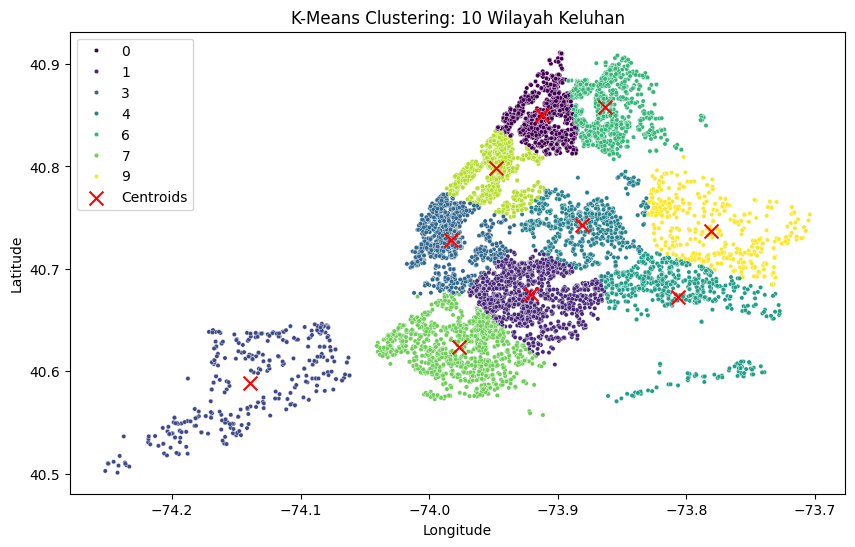


Jumlah keluhan per cluster:
cluster_kmeans
0    1597
1    1388
2     327
3    1129
4     772
5     809
6    1055
7    1241
8    1026
9     486
Name: count, dtype: int64


In [181]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)

df['cluster_kmeans'] = kmeans.fit_predict(coords)

centroids = kmeans.cluster_centers_
print("Pusat Cluster (Latitude, Longitude):")
print(centroids)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Longitude'], y=df['Latitude'], hue=df['cluster_kmeans'], palette='viridis', s=10)
plt.scatter(centroids[:, 1], centroids[:, 0], c='red', marker='x', s=100, label='Centroids')
plt.title(f"K-Means Clustering: {n_clusters} Wilayah Keluhan")
plt.legend()
plt.show()

print("\nJumlah keluhan per cluster:")
print(df['cluster_kmeans'].value_counts().sort_index())

In [182]:
cluster_summary = df.groupby(['cluster_kmeans', 'Complaint Type']).size().reset_index(name='count')
cluster_summary = cluster_summary.sort_values(['cluster_kmeans', 'count'], ascending=[True, False])

top_complaints = cluster_summary.groupby('cluster_kmeans').head(3)
print("3 Keluhan Terbanyak di Tiap Wilayah (Cluster):")
print(top_complaints)

3 Keluhan Terbanyak di Tiap Wilayah (Cluster):
     cluster_kmeans                     Complaint Type  count
23                0                     HEAT/HOT WATER    642
36                0                Noise - Residential    458
28                0                    Illegal Parking     77
89                1                     HEAT/HOT WATER    341
104               1                Noise - Residential    257
64                1                   Blocked Driveway    159
153               2                    Illegal Parking     46
161               2                Noise - Residential     40
158               2  Missed Collection (All Materials)     37
222               3                Noise - Residential    173
206               3                     HEAT/HOT WATER    133
210               3                    Illegal Parking     66
291               4                Noise - Residential    135
254               4                   Blocked Driveway    128
280               4    

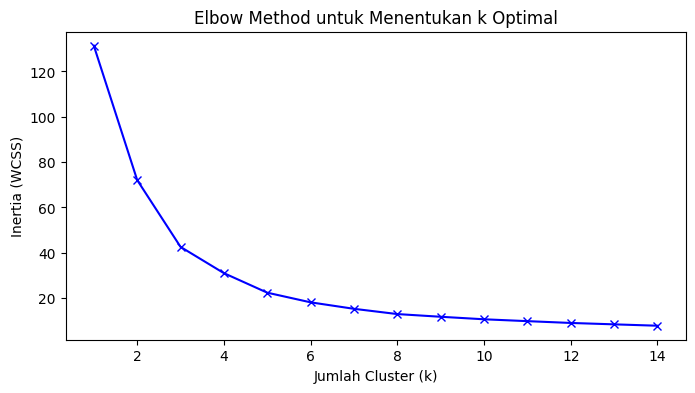

In [183]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []
K = range(1, 15)
for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(coords)
    inertia.append(km.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(K, inertia, 'bx-')
plt.xlabel('Jumlah Cluster (k)')
plt.ylabel('Inertia (WCSS)')
plt.title('Elbow Method untuk Menentukan k Optimal')
plt.show()

In [184]:
from sklearn.metrics import silhouette_score

score = silhouette_score(coords, df['cluster_kmeans'])
print(f"Silhouette Score untuk k=10: {score:.4f}")

Silhouette Score untuk k=10: 0.3909


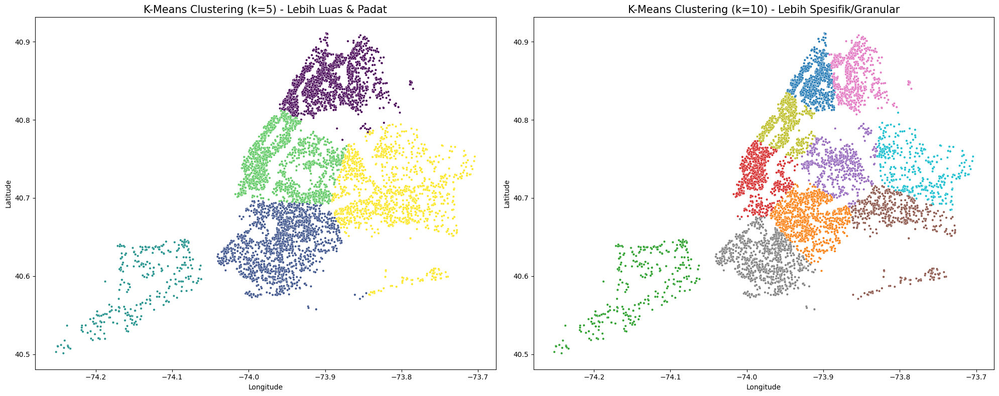

Silhouette Score k=5 : 0.4661
Silhouette Score k=10: 0.3909


In [185]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# 1. Menjalankan K-Means untuk k=5 (Titik Elbow)
kmeans_5 = KMeans(n_clusters=5, init='k-means++', random_state=42)
df['cluster_5'] = kmeans_5.fit_predict(coords)

# 2. Menyiapkan Visualisasi Berdampingan
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Plot untuk k=5
sns.scatterplot(data=df, x='Longitude', y='Latitude', hue='cluster_5',
                palette='viridis', s=10, ax=ax[0], legend=False)
ax[0].set_title('K-Means Clustering (k=5) - Lebih Luas & Padat', fontsize=15)
ax[0].set_xlabel('Longitude')
ax[0].set_ylabel('Latitude')

# Plot untuk k=10
sns.scatterplot(data=df, x='Longitude', y='Latitude', hue='cluster_kmeans',
                palette='tab10', s=10, ax=ax[1], legend=False)
ax[1].set_title('K-Means Clustering (k=10) - Lebih Spesifik/Granular', fontsize=15)
ax[1].set_xlabel('Longitude')
ax[1].set_ylabel('Latitude')

plt.tight_layout()
plt.show()

# 3. Perbandingan Silhouette Score
from sklearn.metrics import silhouette_score
score_5 = silhouette_score(coords, df['cluster_5'])
score_10 = silhouette_score(coords, df['cluster_kmeans'])

print(f"Silhouette Score k=5 : {score_5:.4f}")
print(f"Silhouette Score k=10: {score_10:.4f}")

In [186]:
df.to_csv('k-means_streamlit.csv', index=False)